Plotting the het per individual in a horizonplot

In [1]:
%run ../scripts/notebook_settings.py

In [2]:
zarr_dir = "/faststorage/project/baboondiversity/data/PG_panu3_zarr_12_03_2021/callset.zarr/chrX"
#Opening the zarr data
callset = zarr.open_group(zarr_dir, mode="r")
meta_data_samples = pd.read_table("../data/metadata_with_x_missing.txt", sep=" ")
#gt = allel.GenotypeArray(callset["calldata/GT"])
#pos = callset["variants/POS"][:]

Creating the df

Generating dataframe with True/False for het state

In [3]:
#het_array = gt.is_het()

In [4]:
#het_array.take([0, 2], axis=1)

In [5]:
meta_data_samples

,PGDP_ID,Provider_ID,Provider,Genus,Species,Origin,Sex,address,longitude,latitude,callset_index,C_origin,x_missing
0,16066,16066_3130,Rogers,Papio,cynocephalus,"Mikumi, Tanzania",F,"Mikumi, Kilosa, Morogoro, Coastal Zone, Tanzania",36.977032,-7.404852,0,"Cynocephalus, Central Tanzania",0.013908
1,16098,16098_5026,Rogers,Papio,cynocephalus,"Mikumi, Tanzania",F,"Mikumi, Kilosa, Morogoro, Coastal Zone, Tanzania",36.977032,-7.404852,1,"Cynocephalus, Central Tanzania",0.013826
2,30877,30877_3426,James Else,Papio,anubis,"Aberdare, Kenya",M,"Aberdare National Park, Nyeri, Central Kenya, ...",36.712451,-0.410251,2,"Anubis, Kenya",0.015562
3,30977,30977_3373,James Else,Papio,anubis,"Aberdare, Kenya",F,"Aberdare National Park, Nyeri, Central Kenya, ...",36.712451,-0.410251,3,"Anubis, Kenya",0.009998
4,34449,34449_BZ11022,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,4,"Kindae, Zambia",0.013498
...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,PD_0790,34418_BZ11065,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,222,"Kindae, Zambia",0.009835
223,PD_0791,34419_BZ11066,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,223,"Kindae, Zambia",0.009672
224,PD_0792,34420_BZ11067,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,224,"Kindae, Zambia",0.010119
225,PD_0793,34422_BZ11070,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",M,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,225,"Kindae, Zambia",0.014323


End up choosing to reuse an earlier solution, even though it might be slower

In [6]:
window_size = 100000
chromosomes = [f'chr{x}' for x in range(1, 21)] + ['chrX']

def het_counting(gt):
    return gt.count_het()


chr_df_list = []
for chrom in ["chr7", "chrX"]:
    df_list = []
    callset = zarr.open_group(zarr_dir.format(chrom), mode='r')
    gt = allel.GenotypeArray(callset["calldata/GT"])
    pos = callset["variants/POS"][:]
    for i, row in meta_data_samples.iterrows():
        df = pd.DataFrame()
        individual = (gt.take([row.callset_index], axis=1))
        nnz, windows, counts = allel.windowed_statistic(pos, individual, statistic=het_counting, size=window_size)
        df["het"] = nnz
        df["sex"] = row.Sex
        if i % 50 == 0:
            print(i)
        window_numbering = []
        df.insert(0, column="chrom", value=chrom)
        window_numbering.extend(range(len(nnz)))
        df.insert(1, column="start", value=window_numbering)
        df.insert(2, column = "pop", value = row.PGDP_ID)
        df_list.append(df)
    chr_df = pd.concat(df_list, axis=0)
    chr_df_list.append(chr_df)
    chr_df.to_csv("../steps/het_counts_windows_{}.txt".format(chrom), sep = " ", index=False)
    print("Finished with {}".format(chrom))

0
50
100
150
200
Finished with chr7
0
50
100
150
200
Finished with chrX


In [7]:
full_df = pd.concat(chr_df_list, axis=0)
full_df

,chrom,start,pop,het,sex
0,chr7,0,16066,396,F
1,chr7,1,16066,192,F
2,chr7,2,16066,367,F
3,chr7,3,16066,274,F
4,chr7,4,16066,100,F
...,...,...,...,...,...
1432,chrX,1432,PD_0794_BAB,2,M
1433,chrX,1433,PD_0794_BAB,4,M
1434,chrX,1434,PD_0794_BAB,5,M
1435,chrX,1435,PD_0794_BAB,14,M


In [8]:
#Reloading the old dataframe
meta_data_samples_old = pd.read_table("../data/meta_data_samples.txt", sep = " ")
meta_data_samples_old

,Unnamed: 0,PGDP_ID,Provider_ID,Provider,Genus,Species,Origin,Sex,address,longitude,latitude,callset_index
0,1,PD_0199,09SNF1101115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,0
1,2,PD_0200,11SNF1101115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,1
2,3,PD_0201,19SNM1131115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",M,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,2
3,4,PD_0202,20SNF1131115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,3
4,5,PD_0203,21SNF1151115,Knauf/Chuma/Roos,Papio,anubis,"Serengeti, Tanzania",F,"Serengeti, Mara, Lake Zone, Tanzania",34.742544,-1.996626,4
...,...,...,...,...,...,...,...,...,...,...,...,...
155,212,PD_0789,34417_BZ11064,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,155
156,213,PD_0790,34418_BZ11065,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,156
157,214,PD_0791,34419_BZ11066,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,157
158,215,PD_0792,34420_BZ11067,Rogers/Jolly/Phillips-Conroy,Papio,kindae,"Chunga, Zambia",F,"Chunga, Mumbwa District, Central Province, Zambia",26.005210,-15.053557,158


In [9]:
callset_old = zarr.open_group('/faststorage/project/primatediversity/people/kmt/baboon_flagship/steps/callset.zarr', mode='r')
callset.tree(expand=False)
chr_df_list_old = []
for chrom in ["chr7", "chrX"]:
    df_list_old = []
    gt = allel.GenotypeArray(callset_old["{}/calldata/GT".format(chrom)])
    pos = callset_old["{}/variants/POS".format(chrom)][:]
    for i, row in meta_data_samples_old.iterrows():
        df = pd.DataFrame()
        individual = (gt.take([row.callset_index], axis=1))
        nnz, windows, counts = allel.windowed_statistic(pos, individual, statistic=het_counting, size=window_size)
        df["het"] = nnz
        df["sex"] = row.Sex
        if i % 50 == 0:
            print(i)
        window_numbering = []
        df.insert(0, column="chrom", value=chrom)
        window_numbering.extend(range(len(nnz)))
        df.insert(1, column="start", value=window_numbering)
        df.insert(2, column = "pop", value = row.PGDP_ID)
        df_list_old.append(df)
    chr_df_old = pd.concat(df_list_old, axis=0)
    chr_df_list_old.append(chr_df_old)
    chr_df_old.to_csv("../steps/het_counts_windows_{}_old.txt".format(chrom), sep = " ", index=False)
    print("Finished with {}".format(chrom))

0
50
100
150
Finished with chr7
0
50
100
150
Finished with chrX


In [10]:
full_df_old = pd.concat(chr_df_list_old, axis=0)
full_df_old

,chrom,start,pop,het,sex
0,chr7,0,PD_0199,50.0,F
1,chr7,1,PD_0199,56.0,F
2,chr7,2,PD_0199,35.0,F
3,chr7,3,PD_0199,29.0,F
4,chr7,4,PD_0199,99.0,F
...,...,...,...,...,...
1529,chrX,1529,PD_0793,1086.0,M
1530,chrX,1530,PD_0793,512.0,M
1531,chrX,1531,PD_0793,759.0,M
1532,chrX,1532,PD_0793,1334.0,M


A bit of summary statistics

In [11]:
male_list = meta_data_samples.loc[meta_data_samples.Sex == "M"].PGDP_ID.values
female_list = meta_data_samples.loc[(meta_data_samples.Sex == "F")].PGDP_ID.values

In [12]:
chrX_df = full_df.loc[(full_df.chrom=="chrX") & (full_df.start > 25) & (full_df.start < 1400)]
chrX_male = chrX_df.loc[chrX_df["pop"].isin(male_list)]
chrX_female = chrX_df.loc[chrX_df["pop"].isin(female_list)]

In [13]:
male_list_old = meta_data_samples_old.loc[meta_data_samples_old.Sex == "M"].PGDP_ID.values
female_list_old = meta_data_samples_old.loc[(meta_data_samples_old.Sex == "F")].PGDP_ID.values

In [14]:
chrX_df_old = full_df_old.loc[(full_df_old.chrom=="chrX") & (full_df_old.start > 25) & (full_df_old.start < 1400)]
chrX_male_old = chrX_df_old.loc[chrX_df_old["pop"].isin(male_list_old)]
chrX_female_old = chrX_df_old.loc[chrX_df_old["pop"].isin(female_list_old)]

Statistics for the various combinations

In [15]:
pd.set_option("display.precision", 2)
dfs = [chrX_male, chrX_female, chrX_male_old, chrX_female_old]
names = ["male_nonpar_joint", "female_nonpar_joint", "male_nonpar_single", "female_nonpar_single"]
d_d = {}
for (df_i, name) in zip(dfs, names):
    d_d[name] = {}
    print(len(df_i)/len(df_i["pop"].unique()), len(df_i["pop"].unique()))
    d_d[name]["mean"] = df_i.het.mean()
    d_d[name]["lower quartile"] = df_i.het.quantile(0.25)
    d_d[name]["median"] = df_i.het.quantile(0.5)
    d_d[name]["upper quartile"] = df_i.het.quantile(0.75)
    print("mean", df_i.het.mean())
    print("lower quart", df_i.het.quantile(0.25))
    print("median", df_i.het.quantile(0.5))
    print("upper quart", df_i.het.quantile(0.75))
    
pd.DataFrame(data=d_d)

1374.0 128
mean 57.10290438500728
lower quart 1.0
median 3.0
upper quart 11.0
1374.0 99
mean 91.53927190390073
lower quart 15.0
median 64.0
upper quart 138.0
1374.0 96
mean 31.41839519650655
lower quart 0.0
median 4.0
upper quart 15.0
1374.0 64
mean 86.18640829694323
lower quart 16.0
median 58.0
upper quart 127.0


,male_nonpar_joint,female_nonpar_joint,male_nonpar_single,female_nonpar_single
mean,57.1,91.54,31.42,86.19
lower quartile,1.0,15.00,0.00,16.00
median,3.0,64.00,4.00,58.00
upper quartile,11.0,138.00,15.00,127.00


In [16]:
chrX_male["Sex"] = "M"
chrX_female["Sex"] = "F"
chrX_df = pd.concat([chrX_female, chrX_male], axis=0)

/home/eriks/miniconda3/envs/baboondiversity/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/eriks/miniconda3/envs/baboondiversity/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


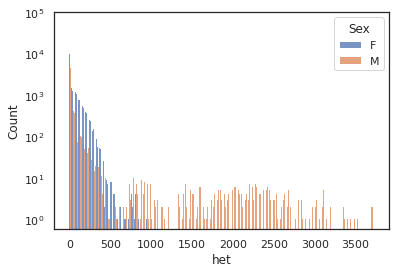

In [17]:
g = sns.histplot(chrX_df, x="het", hue="Sex", multiple="dodge")
g.set_yscale("log")

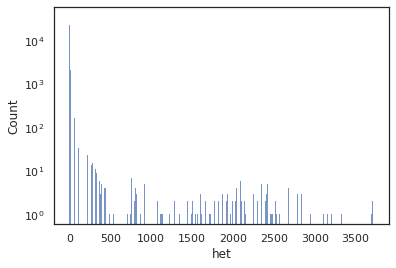

In [18]:
g = sns.histplot(chrX_male, x="het")
g.set_yscale("log")

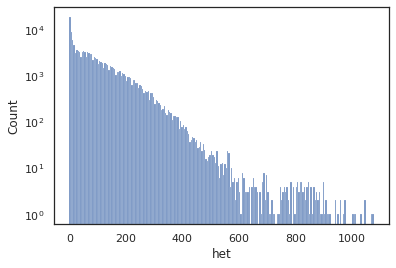

In [19]:
g = sns.histplot(chrX_female, x="het")
g.set_yscale("log")

In [20]:
#Further subsetting, to remove the problematic region in males
dfs = [chrX_male, chrX_female, chrX_male_old, chrX_female_old]
names = ["male_nonpar_joint", "female_nonpar_joint", "male_nonpar_single", "female_nonpar_single"]
d_d = {}
for (df_j, name) in zip(dfs, names):
    df_i = df_j.loc[df_j.start > 250]
    d_d[name] = {}
    print(len(df_i)/len(df_i["pop"].unique()), len(df_i["pop"].unique()))
    d_d[name]["mean"] = df_i.het.mean()
    d_d[name]["lower quartile"] = df_i.het.quantile(0.25)
    d_d[name]["median"] = df_i.het.quantile(0.5)
    d_d[name]["upper quartile"] = df_i.het.quantile(0.75)
    print("mean", df_i.het.mean())
    print("lower quart", df_i.het.quantile(0.25))
    print("median", df_i.het.quantile(0.5))
    print("upper quart", df_i.het.quantile(0.75))
    
pd.DataFrame(data=d_d)

1149.0 128
mean 16.910078057006093
lower quart 1.0
median 3.0
upper quart 11.0
1149.0 99
mean 95.52061959894858
lower quart 16.0
median 68.0
upper quart 143.0
1149.0 96
mean 22.14007651581085
lower quart 0.0
median 4.0
upper quart 14.0
1149.0 64
mean 89.21998748912098
lower quart 16.0
median 61.0
upper quart 131.0


,male_nonpar_joint,female_nonpar_joint,male_nonpar_single,female_nonpar_single
mean,16.91,95.52,22.14,89.22
lower quartile,1.00,16.00,0.00,16.00
median,3.00,68.00,4.00,61.00
upper quartile,11.00,143.00,14.00,131.00


Plotting, in the four X or 7, male or female combinations

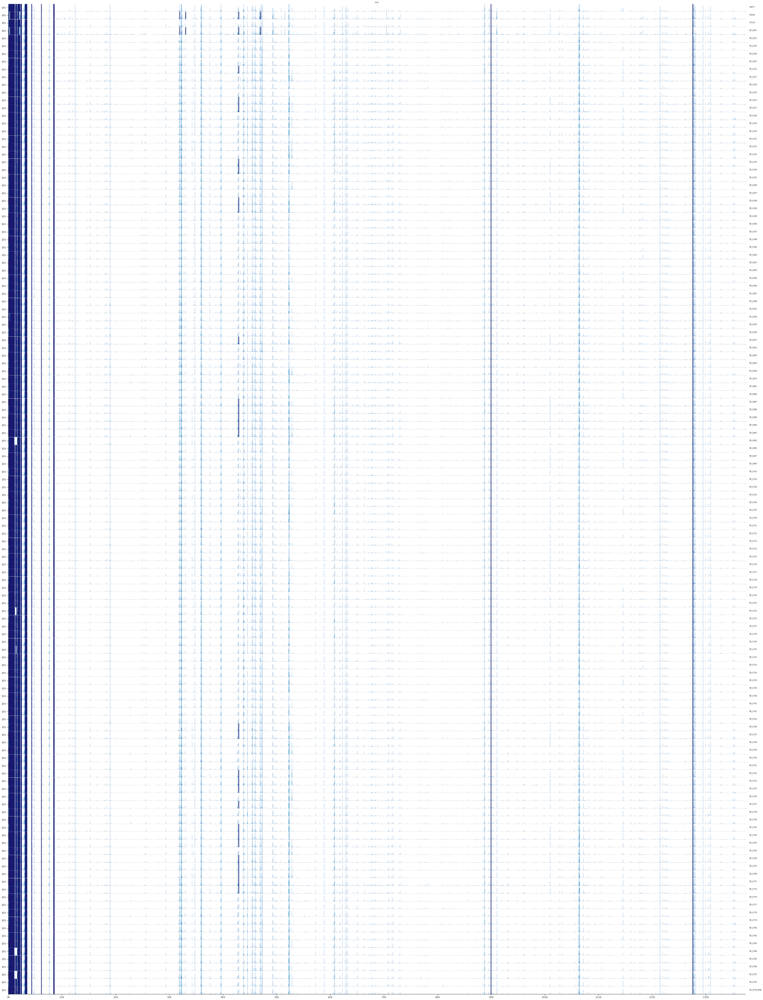

In [21]:
fig = horizonplot(chrX_male, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

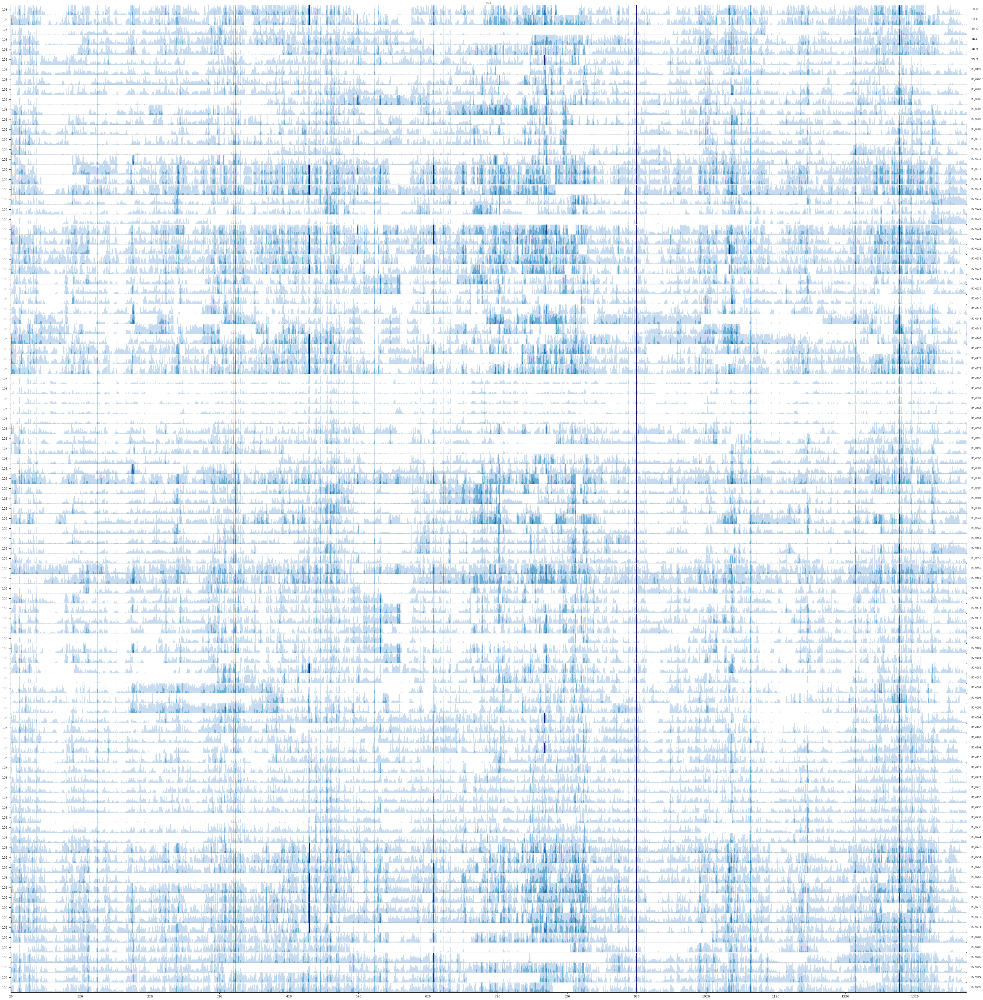

In [22]:
fig = horizonplot(chrX_female, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

Finding the two outliers
#PD_0202
#PD_0690
Updated the metadata so they now are set as males.
# The metadata has now been updated, so they cannot be found anymore.

In [23]:
for i in female_list:
    i_chrX = chrX_female.loc[chrX_female["pop"] == i]
    if i_chrX.het.median() < 20:
        print(i_chrX.het.median(), i)

10.0 PD_0211
6.0 PD_0222
14.0 PD_0390
15.5 PD_0391
15.0 PD_0392
12.0 PD_0393
13.0 PD_0394
12.0 PD_0499
19.0 PD_0651


In [24]:
for i in female_list:
    i_chrX = chrX_female.loc[chrX_female["pop"] == i]
    if i_chrX.het.mean() <= 40:
        print(i_chrX.het.mean(), i)

31.601164483260554 PD_0222
23.74454148471616 PD_0390
26.09825327510917 PD_0391
24.67612809315866 PD_0392
23.729257641921397 PD_0393
23.020378457059678 PD_0394


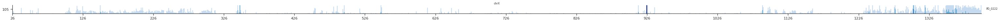

In [25]:
fig = horizonplot(chrX_female.loc[chrX_female["pop"].isin(["PD_0202", "PD_0222", "PD_0690"])]
                                                         , 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

In [26]:
chr7_df = full_df.loc[full_df.chrom=="chr7"]
chr7_male = chr7_df.loc[chr7_df["pop"].isin(male_list)]
chr7_female = chr7_df.loc[chr7_df["pop"].isin(female_list)]

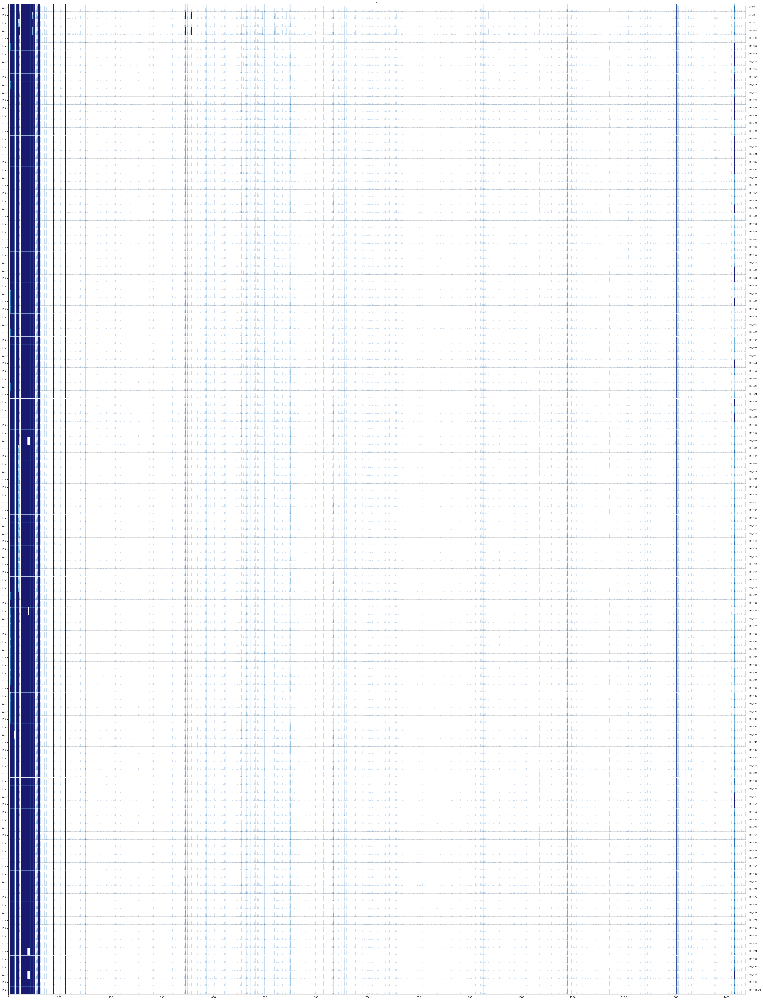

In [27]:
fig = horizonplot(chr7_male, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

All males have the requisite pattern.

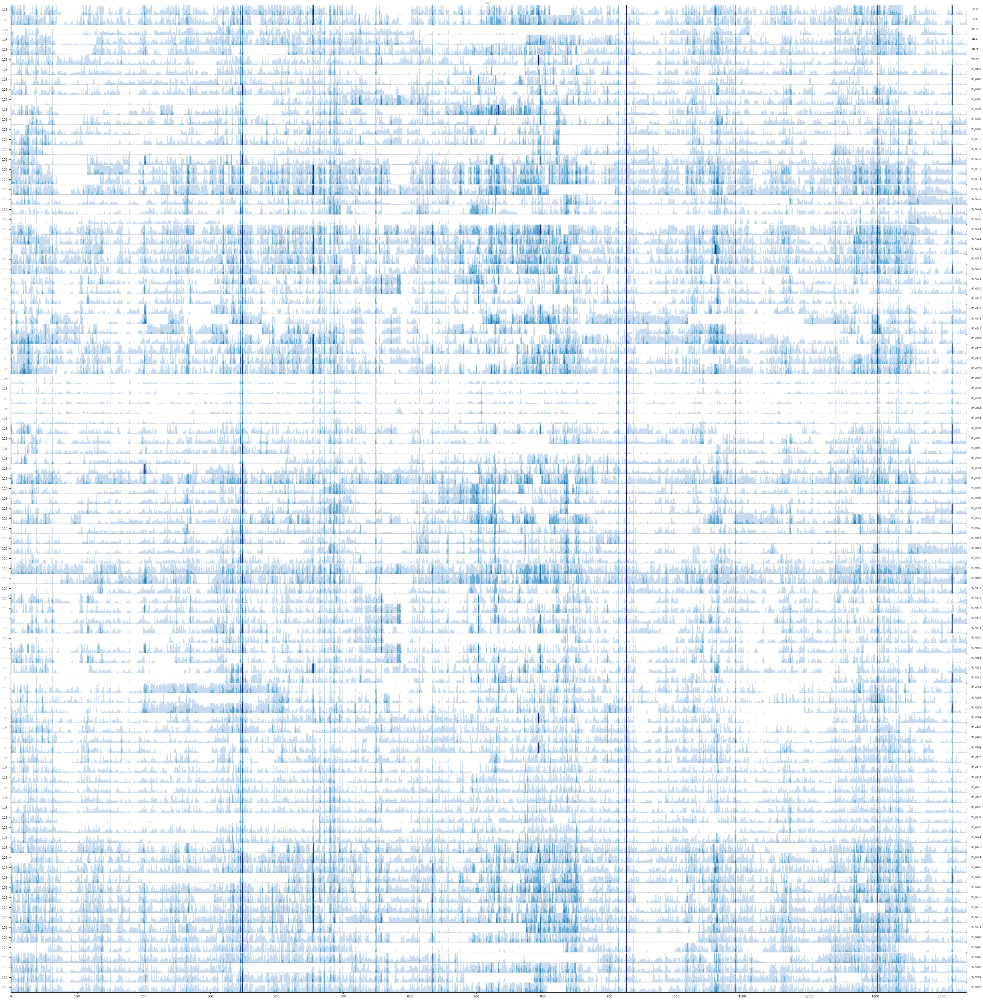

In [28]:
fig = horizonplot(chr7_female, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=100, cut=200)

Some females have male patterns - I will update the metadata.

Plotting on X for each cluster

Cynocephalus, Central Tanzania
Anubis, Kenya
Kindae, Zambia
Gelada, Captive
Hamadryas, Ethiopia
Anubis, Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Anubis, Ethiopia


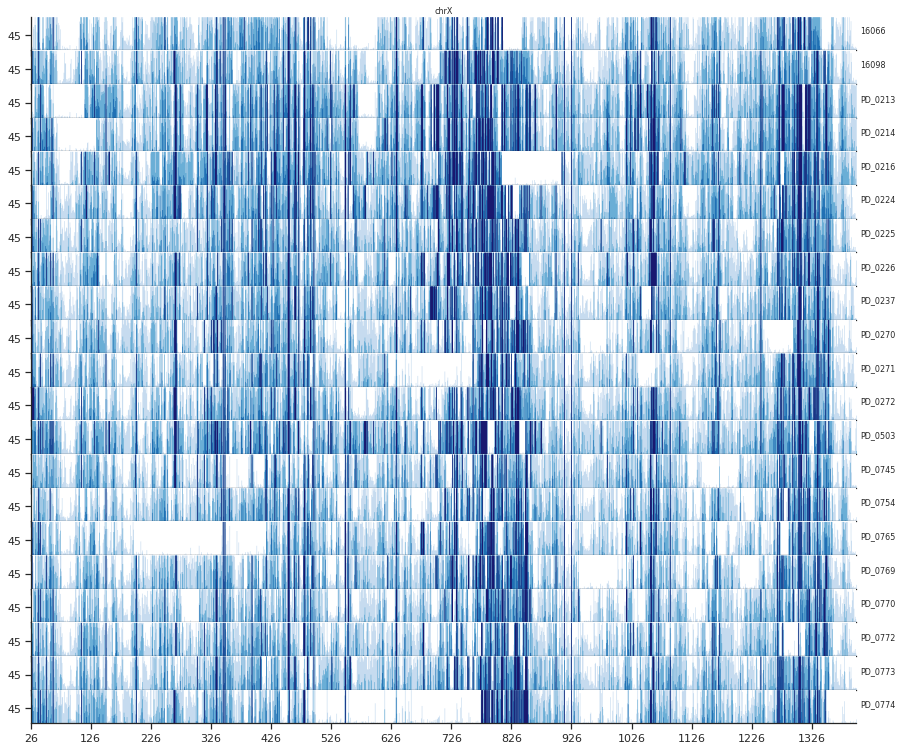

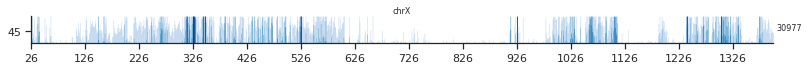

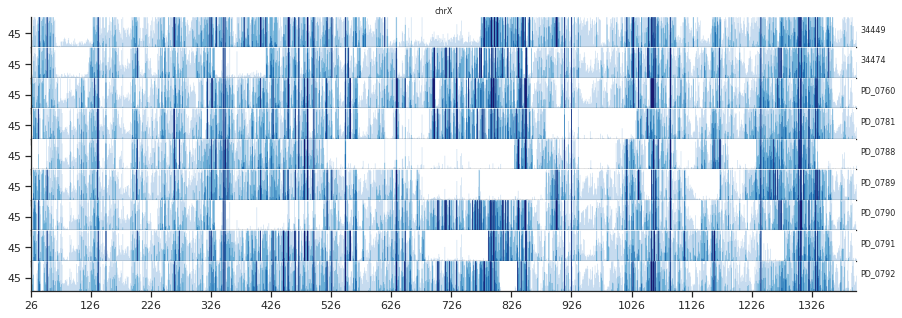

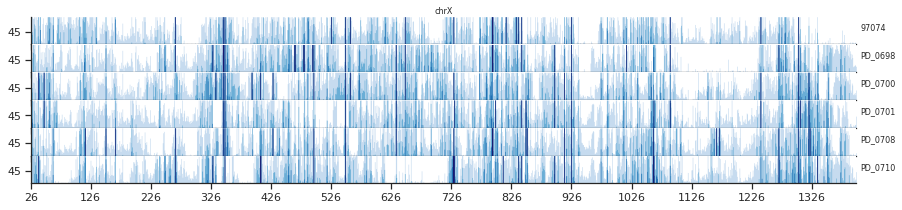

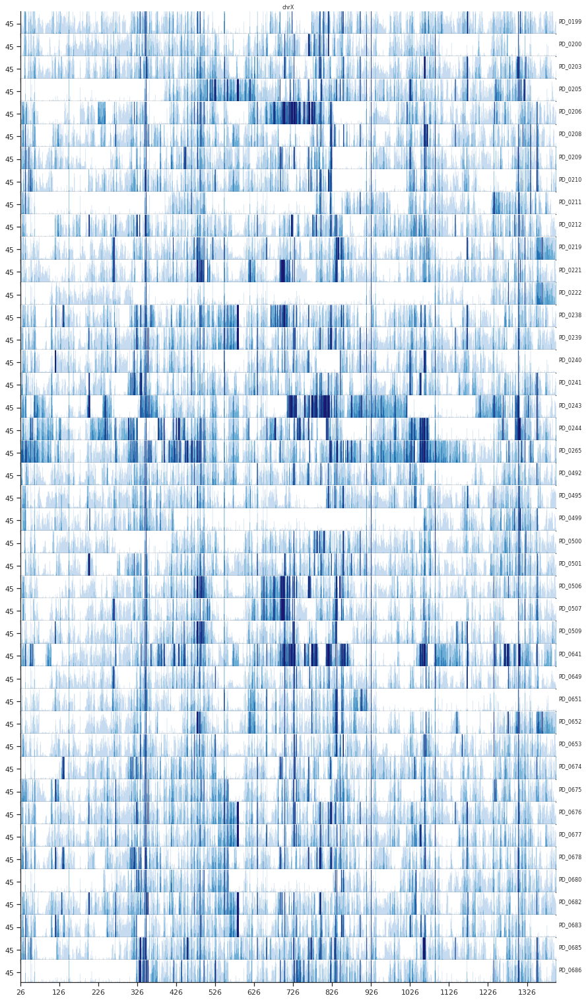

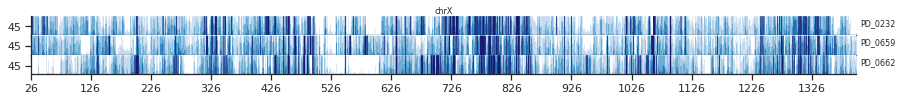

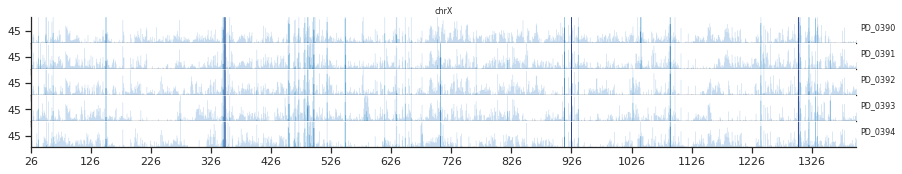

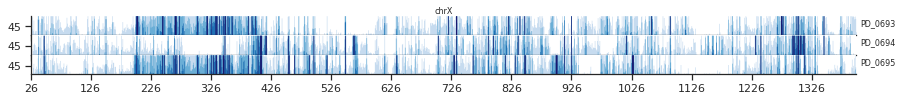

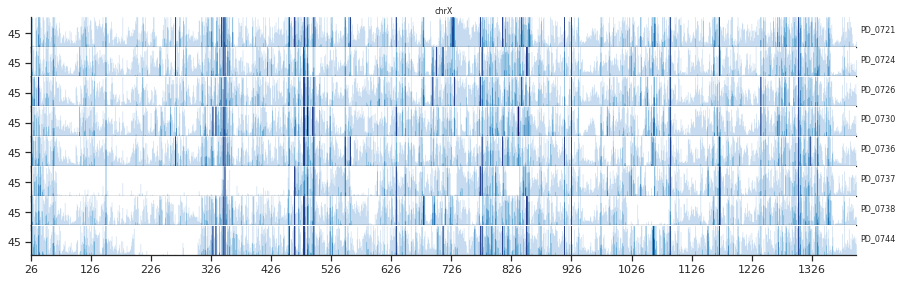

In [29]:
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex =="F") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    if len(f_IDs) == 0:
        continue
    c_chrX = chrX_female.loc[chrX_female["pop"].isin(f_IDs)]
    fig = horizonplot(c_chrX, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=100)
    fig.savefig("../results/horizonplot_{}_chrX_cut100".format(cluster))

Cynocephalus, Central Tanzania
Anubis, Kenya
Kindae, Zambia
Gelada, Captive
Hamadryas, Ethiopia
Anubis, Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Anubis, Ethiopia


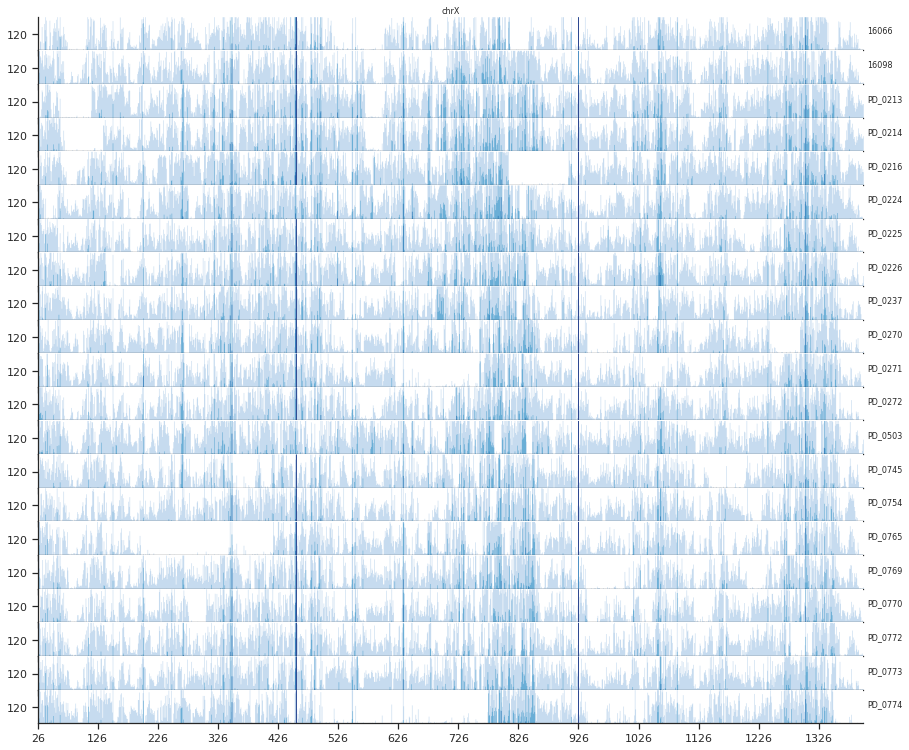

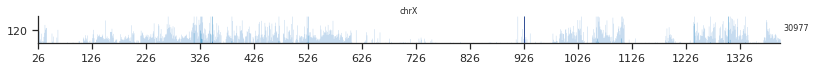

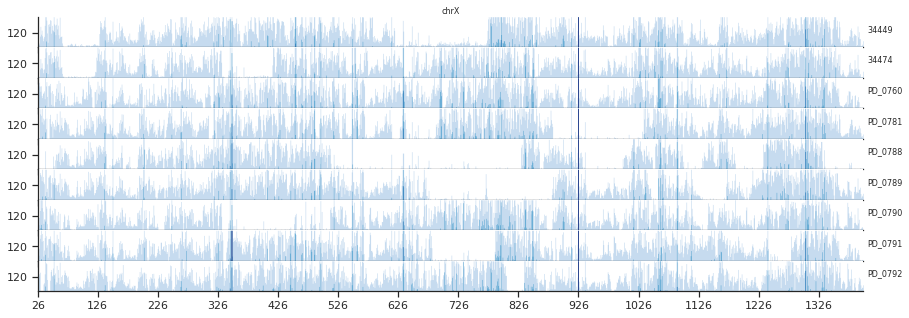

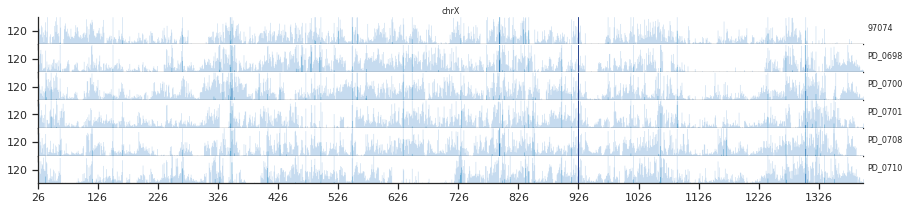

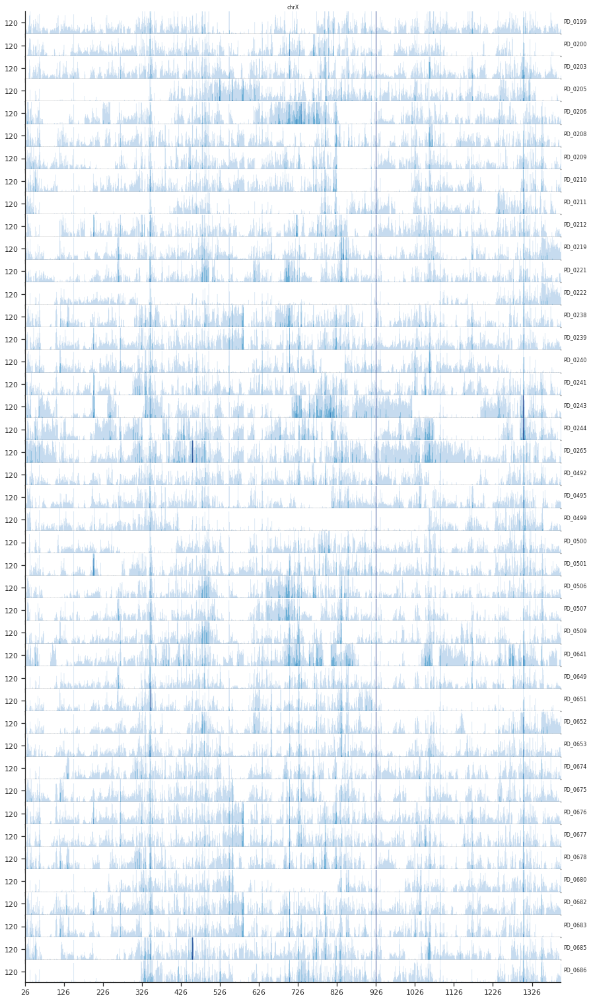

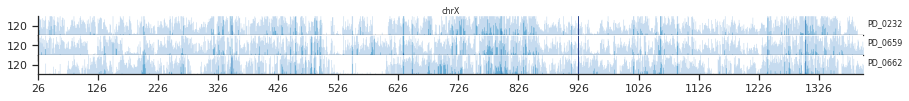

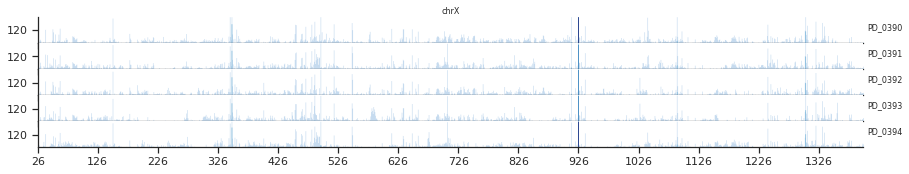

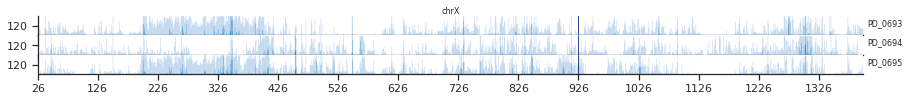

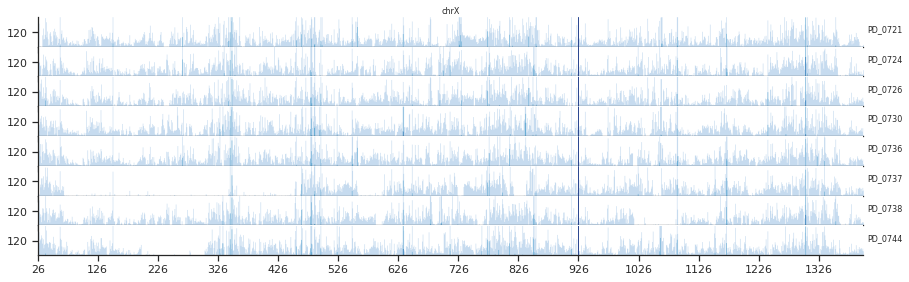

In [30]:
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex =="F") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    if len(f_IDs) == 0:
        continue
    c_chrX = chrX_female.loc[chrX_female["pop"].isin(f_IDs)]
    fig = horizonplot(c_chrX, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=250)
    fig.savefig("../results/horizonplot_{}_chrX_cut250".format(cluster))

In [31]:
df_list = []
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex =="F") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    c_chrX = chrX_female.loc[chrX_female["pop"].isin(f_IDs)]
    df = pd.DataFrame()
    df["mean_het"] = c_chrX.groupby(["start"]).mean()["het"].tolist()
    df.insert(0, column="chrom", value="chrX")
    df.insert(1, column="start", value=c_chrX["start"].unique())
    df.insert(2, column = "pop", value = cluster)
    df_list.append(df)
mean_df = pd.concat(df_list, axis=0)

Cynocephalus, Central Tanzania
Anubis, Kenya
Kindae, Zambia
Gelada, Captive
Hamadryas, Ethiopia
Anubis, Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Anubis, Ethiopia


In [32]:
mean_df

,chrom,start,pop,mean_het
0,chrX,26,"Cynocephalus, Central Tanzania",294.43
1,chrX,27,"Cynocephalus, Central Tanzania",237.19
2,chrX,28,"Cynocephalus, Central Tanzania",179.76
3,chrX,29,"Cynocephalus, Central Tanzania",175.71
4,chrX,30,"Cynocephalus, Central Tanzania",161.10
...,...,...,...,...
1369,chrX,1395,"Anubis, Ethiopia",35.62
1370,chrX,1396,"Anubis, Ethiopia",45.75
1371,chrX,1397,"Anubis, Ethiopia",33.12
1372,chrX,1398,"Anubis, Ethiopia",48.88


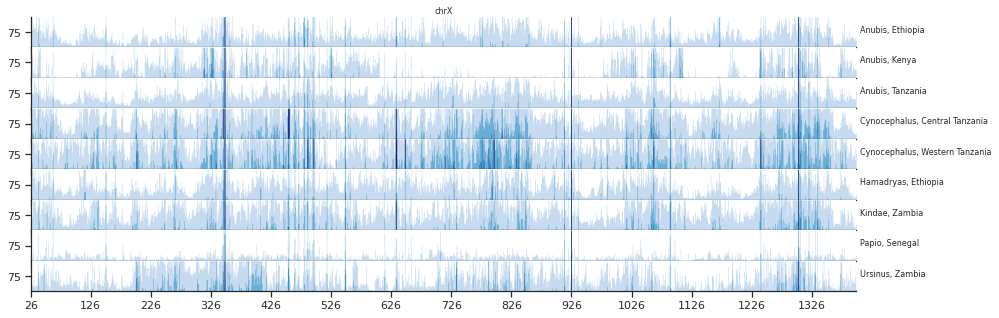

In [33]:
fig = horizonplot(mean_df, 'mean_het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=150)
fig.savefig("../results/horizonplot_chrX_mean_cluster")

Taking non-males to investigate further.

Cynocephalus, Central Tanzania
Anubis, Kenya
Kindae, Zambia
Gelada, Captive
Hamadryas, Ethiopia
Anubis, Tanzania
Cynocephalus, Western Tanzania
Papio, Senegal
Ursinus, Zambia
Anubis, Ethiopia


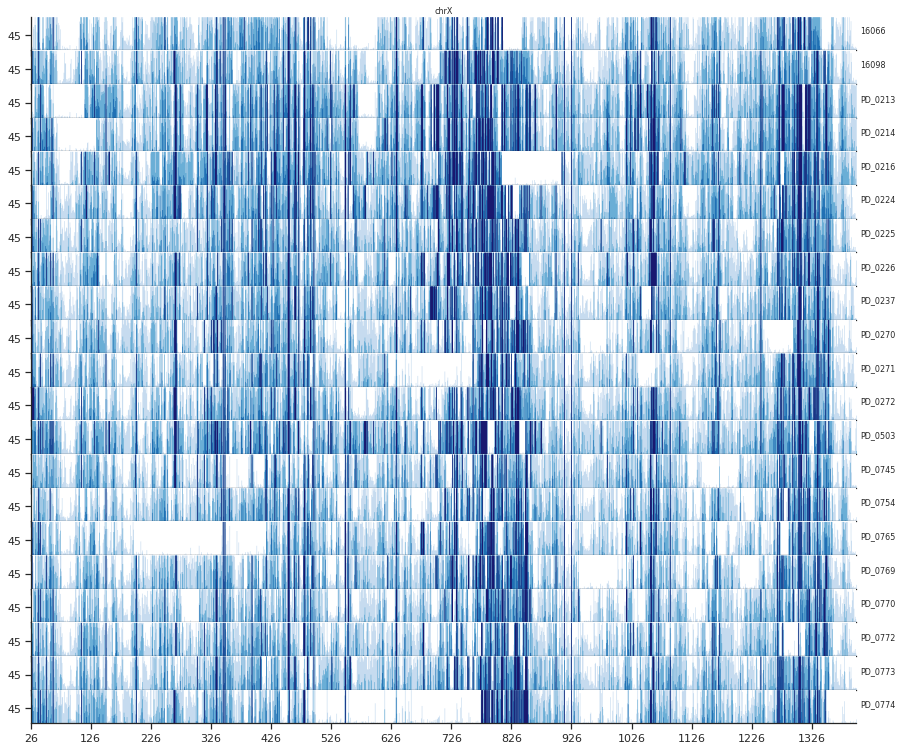

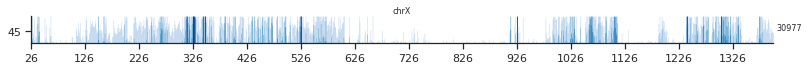

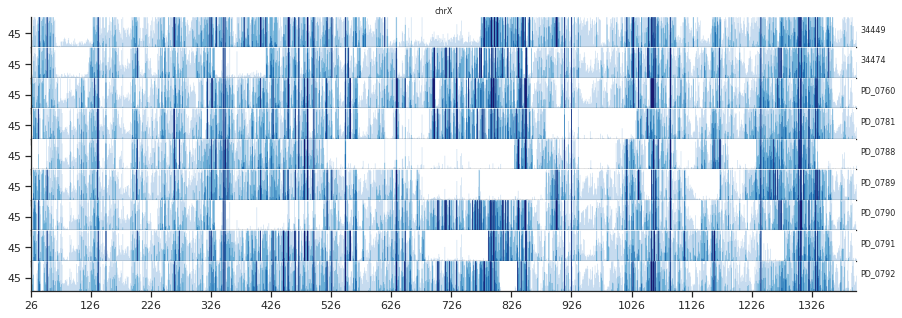

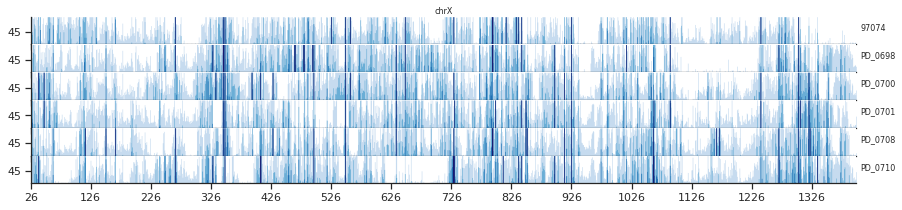

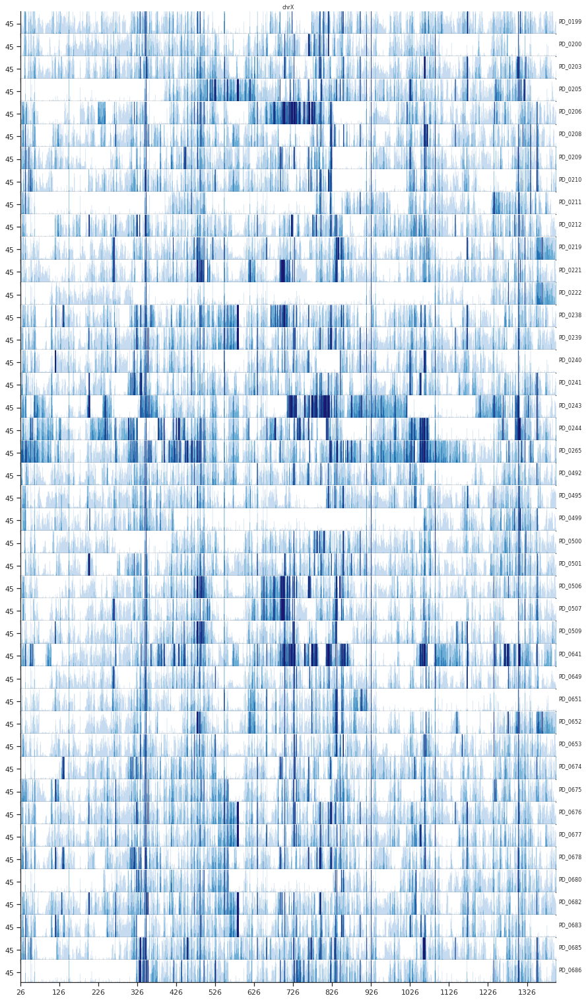

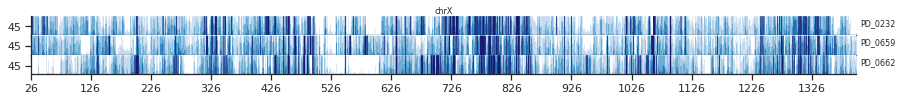

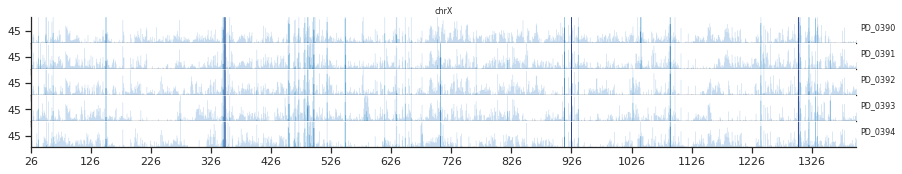

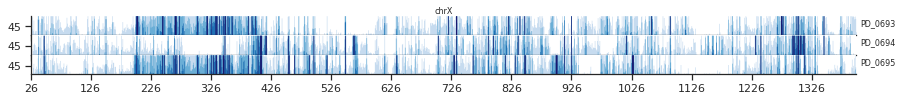

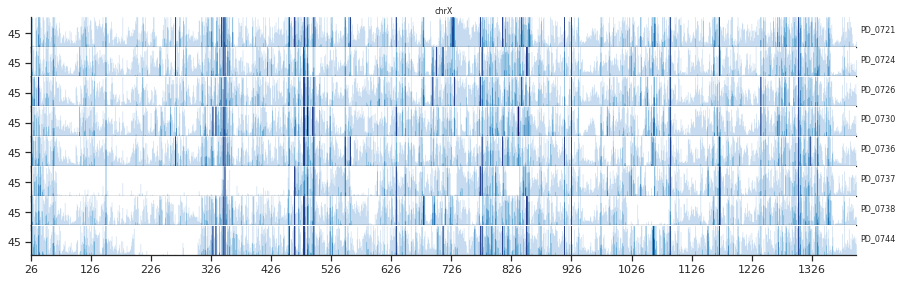

In [34]:
for cluster in meta_data_samples.C_origin.unique():
    print(cluster)
    f_IDs = meta_data_samples.loc[(meta_data_samples.Sex !="M") & (meta_data_samples.C_origin ==cluster)].PGDP_ID.values
    if len(f_IDs) == 0:
        continue
    c_chrX = chrX_df.loc[chrX_df["pop"].isin(f_IDs)]
    fig = horizonplot(c_chrX, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=100)

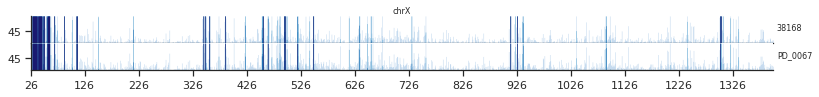

In [35]:
IDs = meta_data_samples.loc[meta_data_samples.C_origin=="Gelada, Captive"].PGDP_ID.values
c_chrX = chrX_df.loc[chrX_df["pop"].isin(IDs)]
fig = horizonplot(c_chrX, 'het', width=1, col='chrom', row='pop', size=0.5, aspect=25, cut=100)

In [36]:
IDs

array(['38168', 'PD_0067'], dtype=object)